# IMA207 - Practical work on SAR statistics

### Statistics and despeckling

The practical work is divided in 3 parts 

- A. empirical checking of the distributions seen in course for single look complex images 
- B.  computation of equivalent number of looks using images of physically homogeneous areas
- C. spatial multi-looking and implementation of the Lee filter

You have at your disposal a set of images coming from different sensors and with different characteristics on the same area of Flevoland in Netherlands (for each sensor and acquisition mode, an homogeneous area of sea has been selected with *mer* extension, and an area of farmland with  *centre* extension):
- Sentinel-1 sensor (ESA), SLC (Single look Complex) data and GRD (Ground Range Detected) data ;
- ERS sensor (ESA), PRI product (ground range data);
- Alos sensor (JAXA), SLC (Single look Complex) data.

Some useful functions are available in the file *mvalab.py*.

### Name: **THALIS ROCHA PESTANA**

#### Instructions

To solve this practical session, answer the questions below. Then export the notebook with the answers using the menu option **File -> Download as -> Notebook (.ipynb)**. Then [submit the resulting file on e-campus by next week. 

### Import the libraries and packages we are going to use
The following cell imports all that is going to be necessary for the practical work

In [ ]:
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/mvalab.py

--2023-05-09 19:13:49--  https://perso.telecom-paristech.fr/tupin/TPSAR/mvalab.py
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68071 (66K) [text/x-python]
Saving to: ‘mvalab.py’

mvalab.py           100%[===================>]  66.48K  --.-KB/s    in 0.1s    

2023-05-09 19:13:50 (478 KB/s) - ‘mvalab.py’ saved [68071/68071]



In [ ]:
import scipy
from scipy import signal
import scipy.signal
import scipy as spy
import scipy.fftpack
from scipy import ndimage
from scipy import special
from scipy import ndimage
import numpy as np
import math
import matplotlib.pyplot as plt
import mvalab as mvalab
from urllib.request import urlopen
import cmath

plt.rcParams['figure.figsize'] = [15, 15]
plt.rcParams['figure.max_open_warning'] = 30

## A. Single look data distributions 
In this part, we will use an SLC (Single Look Complex) image and analyze its pdf. 
The image has been acquired by the Sentinel-1 sensor over the Lelystad zone (very flat area with fields crops). 
Vizualize the amplitude image and interpret it. You may want to have a look to an [optical image](https://goo.gl/maps/JJcYcRjMKj1p6uqW8) of the area

N.B.: An amplitude image is given by the modulus of the electro-magnetic field and intensity is the square of the amplitude (proportional to the signal power). 

imz2mat : version janvier 2018.  Fichier à ouvrir : https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/Lely.CXF
Nom compatible url
Nom compatible url
Complex float, Fichiers PC
INFO - reading header/dim : https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/Lely.dim
lecture .dim OK -> largeur:3072 hauteur:1024 profondeur:1
Debug 2 4 3072
4 3072 <f
Affichage d'une image complexe : on prend le module
plt.show dans visusar : image 2000 x 1000


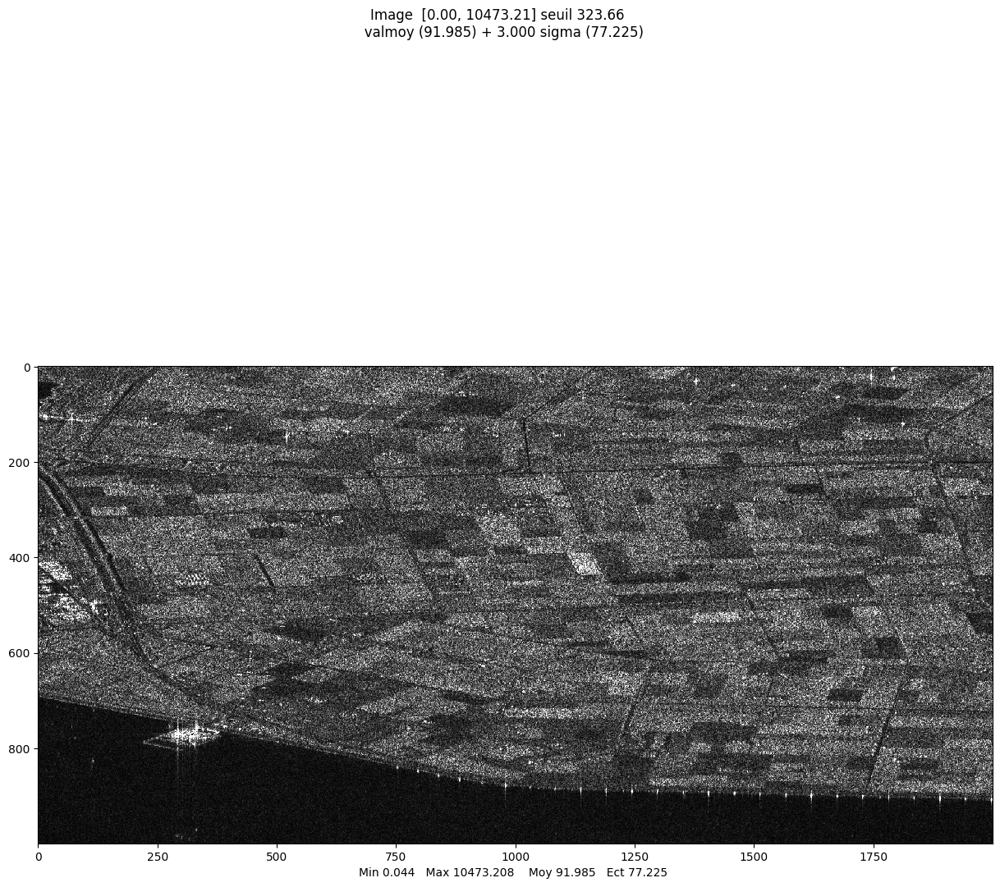

array([[189.39645707, 120.37768382,  88.18239552, ...,  15.83329392,
         81.56227421,  49.77878747],
       [ 82.14861489, 182.63059347, 129.35037906, ...,  27.13825688,
        125.72671142, 110.59154859],
       [ 70.72612706,  95.41594535, 172.73440866, ...,  94.75140509,
        135.06825916, 110.69568918],
       ...,
       [ 28.69899713,  17.15711468,  41.06853971, ...,  29.98631779,
         33.79961213,  25.71624981],
       [ 13.0488964 ,  25.83298061,  43.69642329, ...,  17.40038001,
          9.72895615,  27.4559638 ],
       [ 24.08634607,  19.56106813,   4.41799745, ...,  31.60940237,
         41.32337103,  19.87143731]])

In [ ]:
pageweb="https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/"
image='Lely.CXF'
im_slc_senti_lely_liste=mvalab.imz2mat(pageweb+image);
im_slc_senti_lely = im_slc_senti_lely_liste[0]
ncol=im_slc_senti_lely_liste[1]
nlig=im_slc_senti_lely_liste[2]

mvalab.visusar(im_slc_senti_lely[0:1000,0:2000])


#### Data distributions for an homogeneous area
Select a physically homogeneous area (you can zoom and see coordinates as you move the arrow on the image) and compute the distribution of the real part, imaginary part, phase, intensity and amplitude. Some useful functions are:
- `np.angle`
- `np.real`
- `np.imag` 

Then, estimate the coefficient of variation:  
$\gamma=\frac{\sigma}{\mu}$ using intensity data (square of the modulus of the complex field)



Affichage d'une image complexe : on prend le module
plt.show dans visusar : image 200 x 150


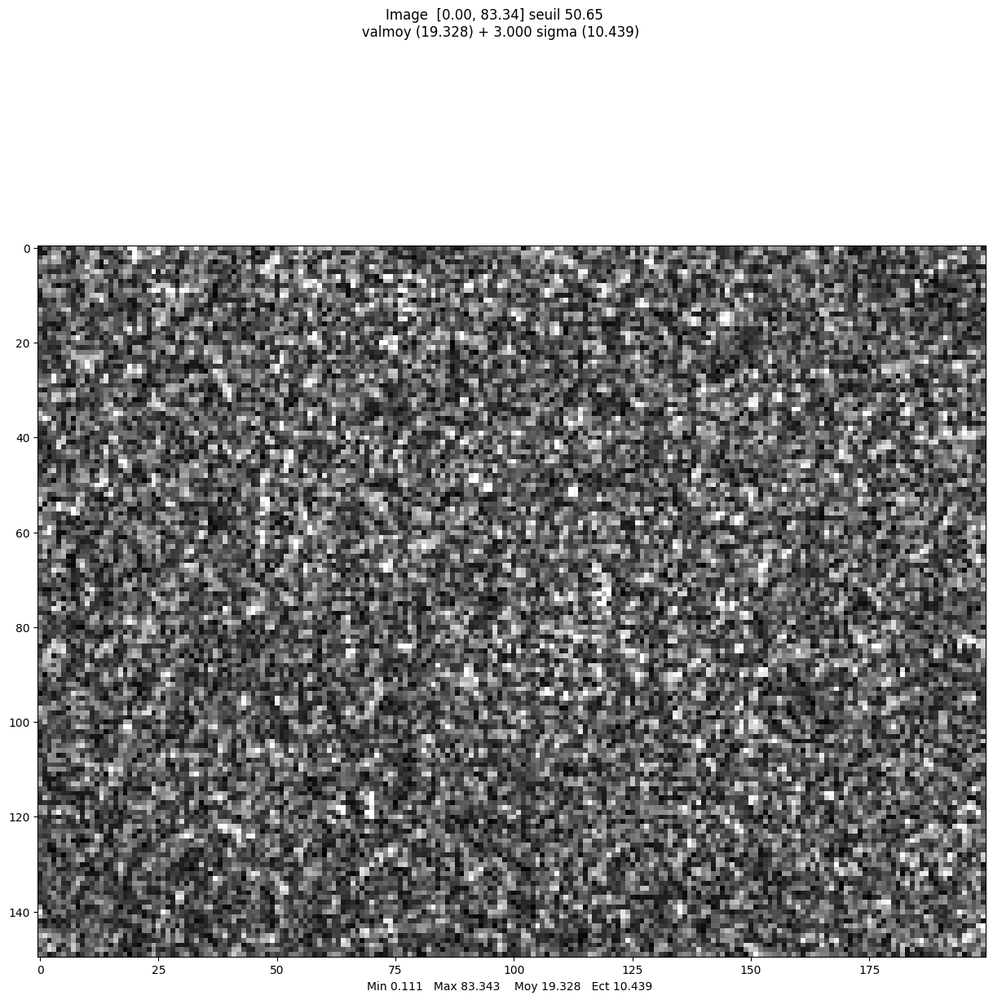

In [ ]:
# Select a crop of the image (around 150 by 150 pixels)
# which is physically homogeneous 
crop_slc = im_slc_senti_lely[850:1000,0:200] 
#complete
mvalab.visusar(crop_slc)

# Compute amplitude, intensity, phase, real and imaginary part
amp_senti_lely = np.abs(crop_slc) #complete
int_senti_lely = np.abs(crop_slc)**2 #complete
ph_senti_lely = np.angle(crop_slc)  #complete
real_senti_lely = np.real(crop_slc) #complete
imag_senti_lely = np.imag(crop_slc) #complete


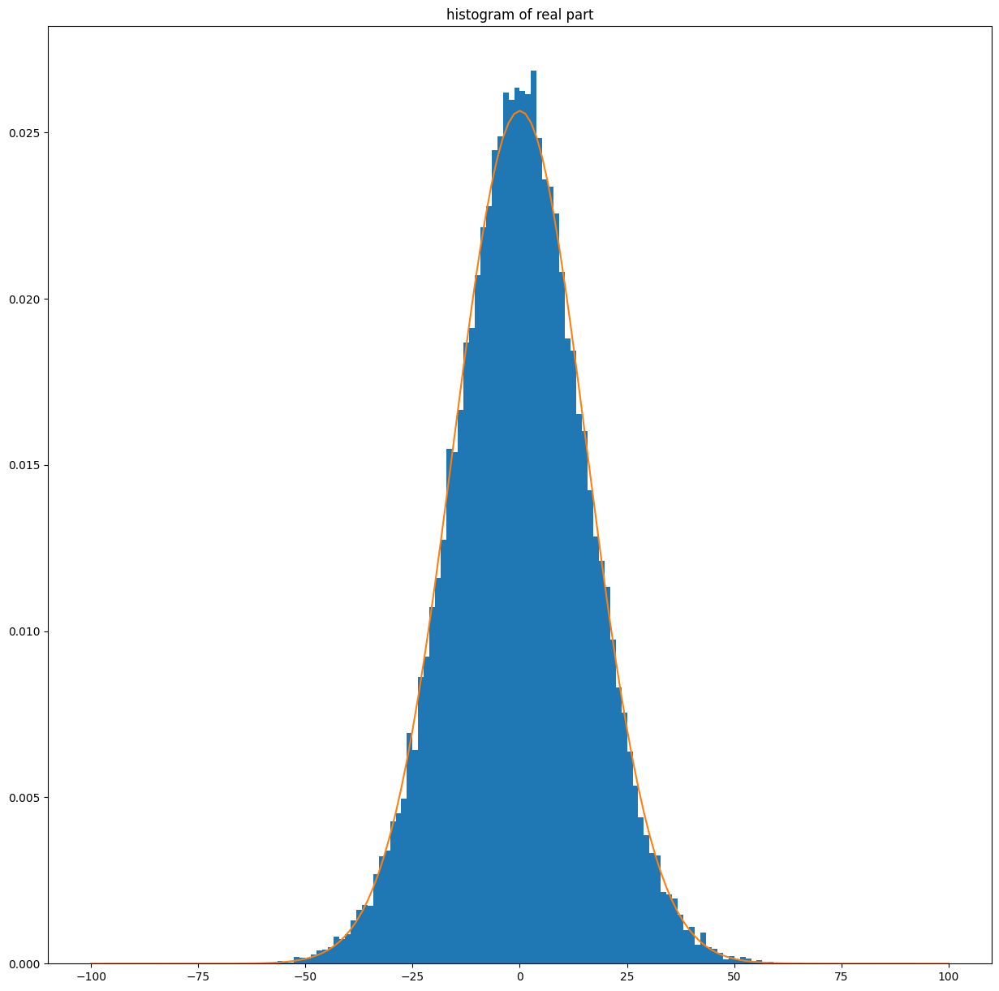

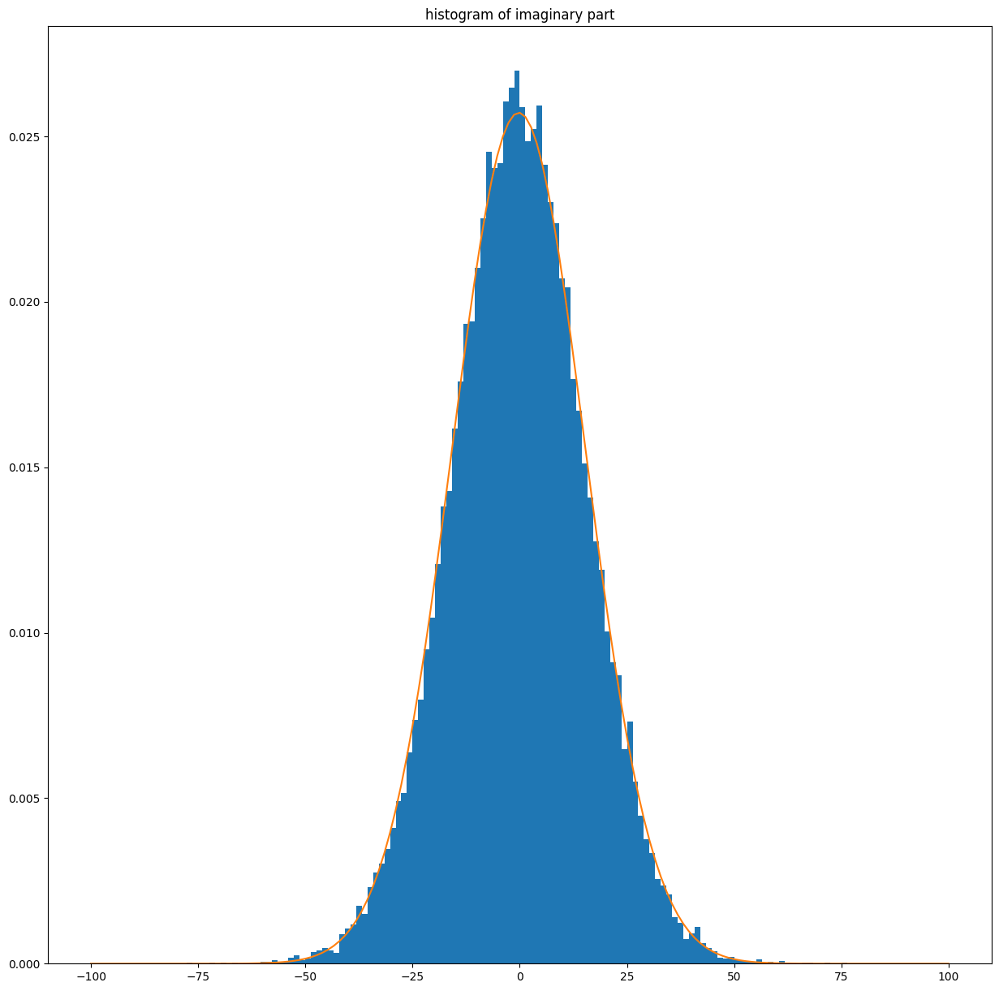

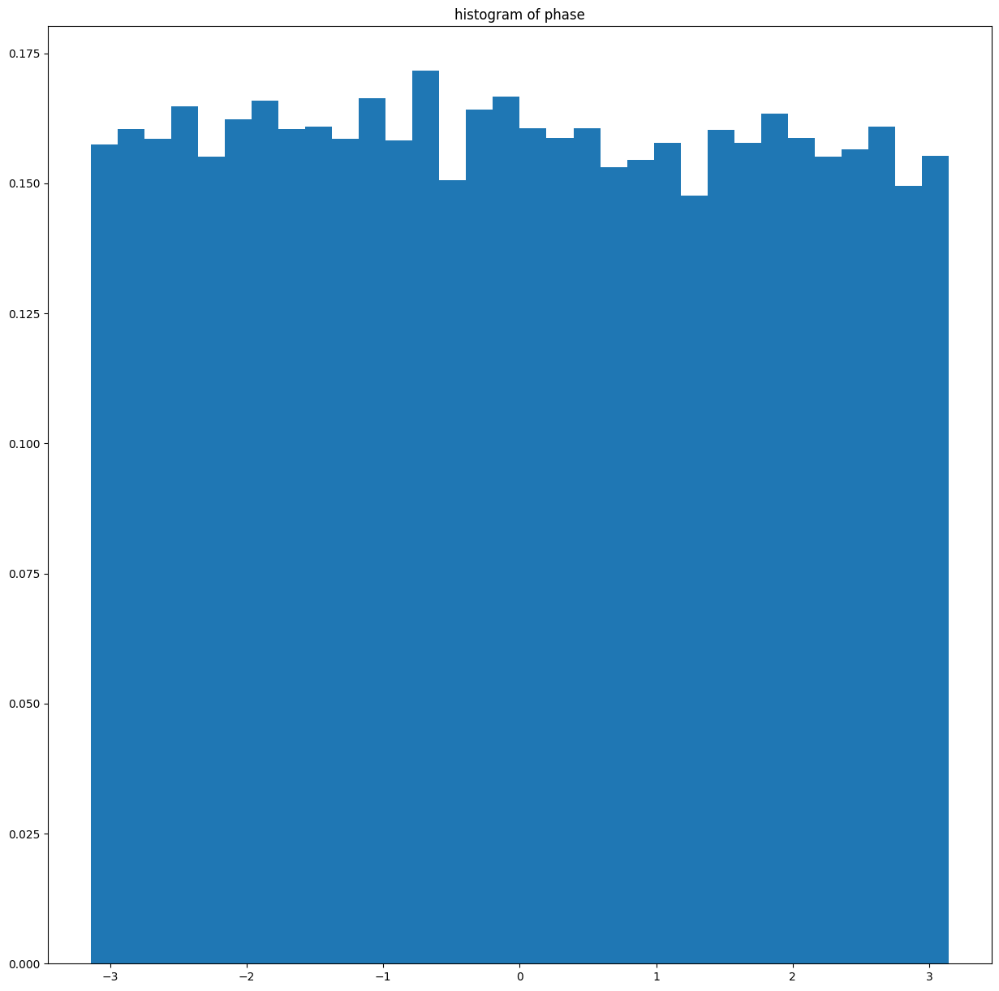

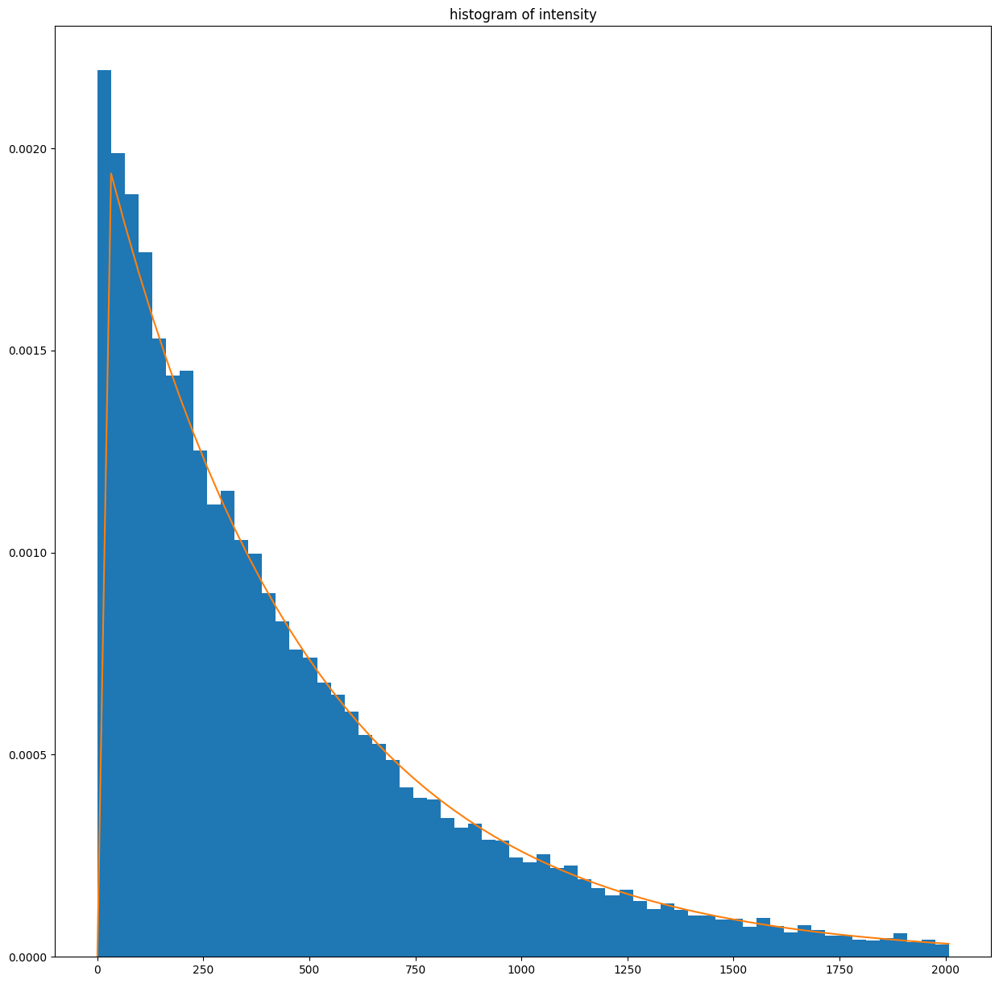

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:48: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/usr/local/lib/python3.10/dist-packages/scipy/stats/_continuous_distns.py:7761: RuntimeWarning: overflow encountered in square
  s2 = (xm**2).sum()
/usr/local/lib/python3.10/dist-packages/scipy/stats/_continuous_distns.py:7763: RuntimeWarning: invalid value encountered in double_scalars
  return s1 - s2/(2*len(data))*s3


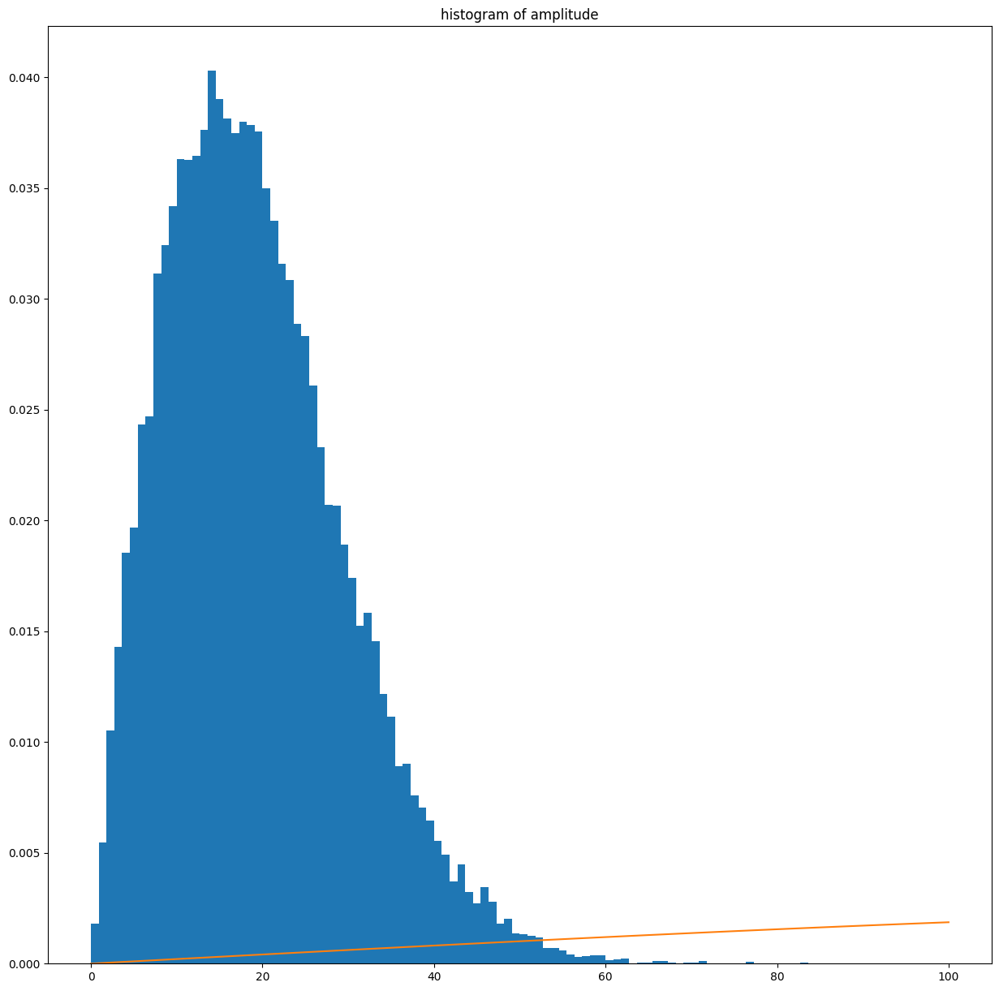

In [ ]:
# Plot the histograms and verify they match the theoretical distribution
# Use the right range of values to plot the histogram 
# Choose the right distribution to do the fitting

# fitting of the distributions 
# use the following ones :
# Gaussian pdf : scipy.stats.norm
# Rayleigh pdf : scipy.stats.rayleigh
# Exponential pdf : scipy.stats.expon

#example for real part of the data 
plt.figure()
_, bins, _ = plt.hist(real_senti_lely.ravel(),bins='auto',density=True,range=[-100,100])  # Gaussian distribution
mu, sigma = scipy.stats.norm.fit(real_senti_lely)
best_fit_line = scipy.stats.norm.pdf(bins, mu, sigma) 
plt.plot(bins, best_fit_line)
plt.title('histogram of real part')
plt.show()

#complete for imaginary part: Gaussian distribution
plt.figure()
_, bins, _ = plt.hist(imag_senti_lely.ravel(),bins='auto',density=True,range=[-100,100]) 
mu, sigma = scipy.stats.norm.fit(imag_senti_lely)
best_fit_line = scipy.stats.norm.pdf(bins, mu, sigma)
#complete
plt.plot(bins, best_fit_line)
plt.title('histogram of imaginary part')
plt.show()


#complete for phase data: Uniform distribution
plt.figure()
plt.hist(ph_senti_lely.ravel(),bins='auto',density=True, range=[-np.pi, np.pi]) #complete
plt.title('histogram of phase')
plt.show()


#complete for intensity data: Exponential (Gamma) distribution
plt.figure()
_, bins, _ = plt.hist(int_senti_lely.ravel(),bins='auto',density=True,
                      range=[0, np.mean(int_senti_lely) + 3*np.std(int_senti_lely)]);
mu, sigma = scipy.stats.expon.fit(int_senti_lely)
best_fit_line = scipy.stats.expon.pdf(bins, mu, sigma)
#complete
plt.plot(bins, best_fit_line)
plt.title('histogram of intensity')
plt.show()

#complete for amplitude data: Rayleigh distribution
plt.figure()
_, bins, _ = plt.hist(amp_senti_lely.ravel(),bins='auto',density=True,
                      range=[0,100]) #complete
mu, sigma = scipy.stats.rayleigh.fit(amp_senti_lely)
best_fit_line = scipy.stats.rayleigh.pdf(bins, mu, sigma)
plt.plot(bins, best_fit_line)
plt.title('histogram of amplitude')
plt.show()

In [31]:
# Compute the coefficient of variation on the homogeneous crop in intensity

m_I = np.mean(int_senti_lely) #complete
sigma_I = np.std(int_senti_lely) #complete
coeff_var_I = sigma_I/m_I
print("Coefficient of variation on the homogeneous crop =", coeff_var_I)

Coefficient of variation on the homogeneous crop = 1.0535827311258144


### Question A.1. 
Did you find the distributions seen in the course ? (recapitulate them).
Did you find the correct value for the coefficient of variation ? How would this coefficient be modified if the selected area is physically heterogeneous ? Could this coefficient be less than the theoretical value ?


### Answer A.1.

Observing the images above, it is possible to observe that they match the theoretical distributions seen in the course (Gaussian and Rayleigh distributions). The value for the coefficient of variation is 1.05, which is close to the theoretical value of 1.

If the selected area is phisically heterogeneous, the Goodman conditions are no longer valid. In this case we can not affirm that the mean and standard deviation are proportional and the coefficient of variation will assume different values. Generally, these values tend to be greater than the theoretical one, since heteroogeneous regions present a greater variation. However, in some cases the coefficient can be less than the theoretical value. 




## B. Computation of the Equivalent Number of looks on homogeneous areas
In this part you have at your disposal 2 images of a part of the sea. One is a Sentinel-1 GRD image and the other one is an ERS image. The multi-looking has been done by the data provider (ESA, European Space Agency).
Use the value of the coefficient of variation to find the Equivalent Number of Looks (ENL) of the Sentinel-1 GRD and ERS data. 
The formula is :
- $\gamma_I=\frac{1}{\sqrt{L}}$ for intensity data 


imz2mat : version janvier 2018.  Fichier à ouvrir : https://perso.telecom-paristech.fr/tupin/TPSAR/DATA/images/SentinelGRD_flevoland_mer.imw
Nom compatible url
Nom compatible url
Unsigned short, Fichiers Unix
INFO - reading header/dim : https://perso.telecom-paristech.fr/tupin/TPSAR/DATA/images/SentinelGRD_flevoland_mer.dim
lecture .dim OK -> largeur:512 hauteur:512 profondeur:1
Debug 1 2 512
2 512 >H
Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


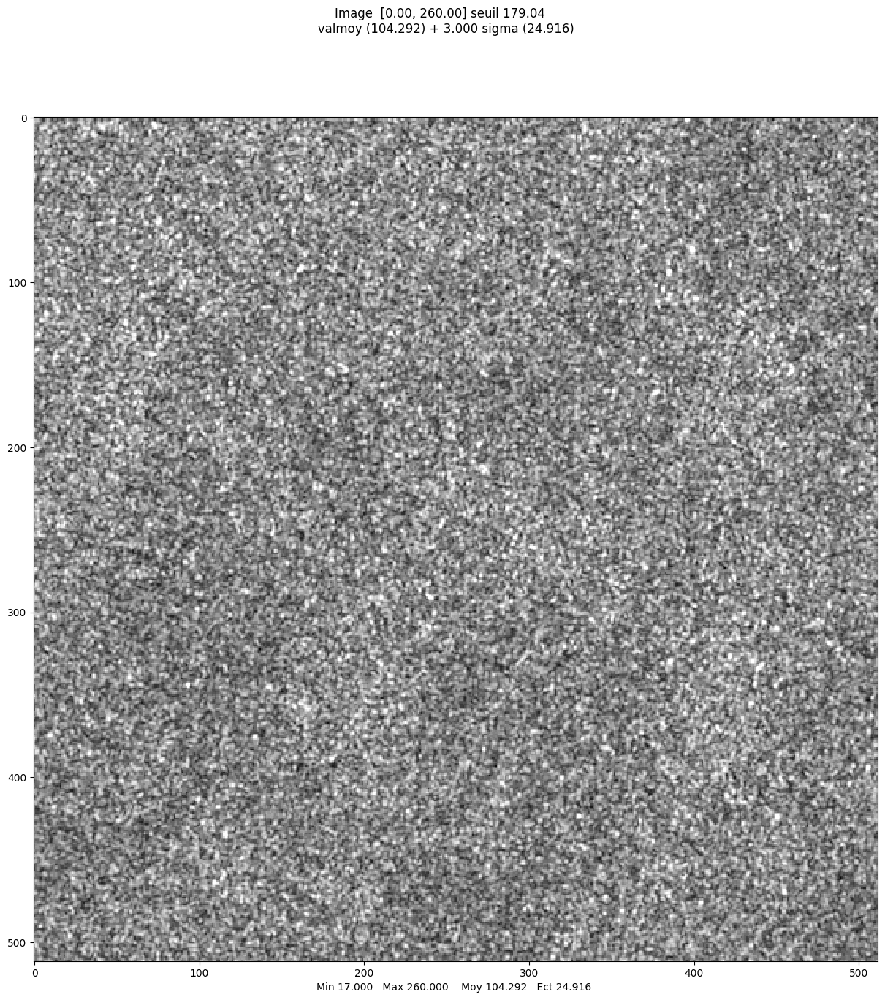

--- coeff var and L ---
4.1857666466406585
0.057075532735666394


In [30]:
pageweb='https://perso.telecom-paristech.fr/tupin/TPSAR/DATA/images/'
image = 'SentinelGRD_flevoland_mer.imw'
im_sentigrd_mer = mvalab.imz2mat(pageweb+image)
mvalab.visusar(np.abs(im_sentigrd_mer[0]))

# compute coefficient of variation and number of looks
coeff_var_grd = np.mean(im_sentigrd_mer[0])/np.std(im_sentigrd_mer[0]) 
L_grd = 1/coeff_var_grd**2 #complete
print('--- coeff var and L ---')
print(coeff_var_grd)
print(L_grd)

imz2mat : version janvier 2018.  Fichier à ouvrir : https://perso.telecom-paristech.fr/tupin/TPSAR/DATA/images/ERS_flevoland_mer.imw
Nom compatible url
Nom compatible url
Unsigned short, Fichiers Unix
INFO - reading header/dim : https://perso.telecom-paristech.fr/tupin/TPSAR/DATA/images/ERS_flevoland_mer.dim
lecture .dim OK -> largeur:512 hauteur:512 profondeur:1
Debug 1 2 512
2 512 >H
Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


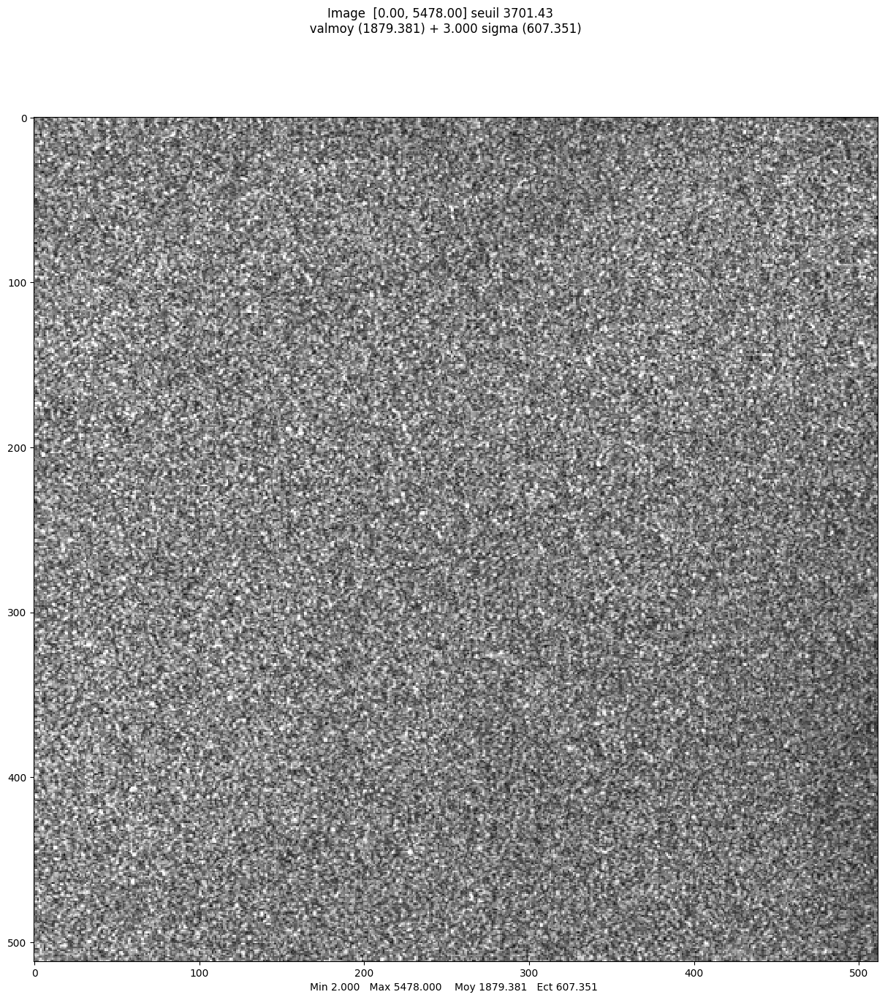

array([[1198., 1579., 2003., ..., 1298., 1353., 1211.],
       [1376., 2099., 2276., ..., 1391.,  997., 1119.],
       [1723., 1156., 2449., ..., 2171., 1939., 1304.],
       ...,
       [2246., 2725., 2067., ..., 1511., 1493., 1497.],
       [1804., 1906., 2140., ..., 1820., 1267., 1317.],
       [2227., 1462., 1627., ..., 1664., 1697., 1639.]])

In [ ]:
image = 'ERS_flevoland_mer.imw'
im_ers_mer = mvalab.imz2mat(pageweb+image)
mvalab.visusar(np.abs(im_ers_mer[0]))

# compute coefficient of variation and number of looks


### Question B.1
Comment the number of looks you have found for GRD and ERS data (is it an integer value ? why not ? what does it mean ?).




### Answer B.1

The number of looks is calculated using the empirical coeficient of variation that assumes that the multi-looking are independent and identically distributed. However, in practice, the samples to do the multi-looking are not i.i.d. In this case, the number of looks is no more an integer value and will be less than announced by the data provider.


## C. Spatial multi-looking and implementation of the Lee filter

In this part we will try simple speckle reduction method using the following step :
- first we will compute a mean filter 
- then we will compute the local coefficient of variation (using the same size for the moving window)
- finally we will combine these two results to obtain the Lee filter.

## C.1 Computation of the mean filter
Compute the mean filter using a 2D convolution. 

imz2mat : version janvier 2018.  Fichier à ouvrir : https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA
Nom compatible url
Nom compatible url
INFO - reading header/dim : https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.dim
Multitemporal image 25 data
Fichiers PC
Image  complex float
lecture .dim OK -> largeur:512 hauteur:512 profondeur:25
Debug 2 4 512
4 512 <f
Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


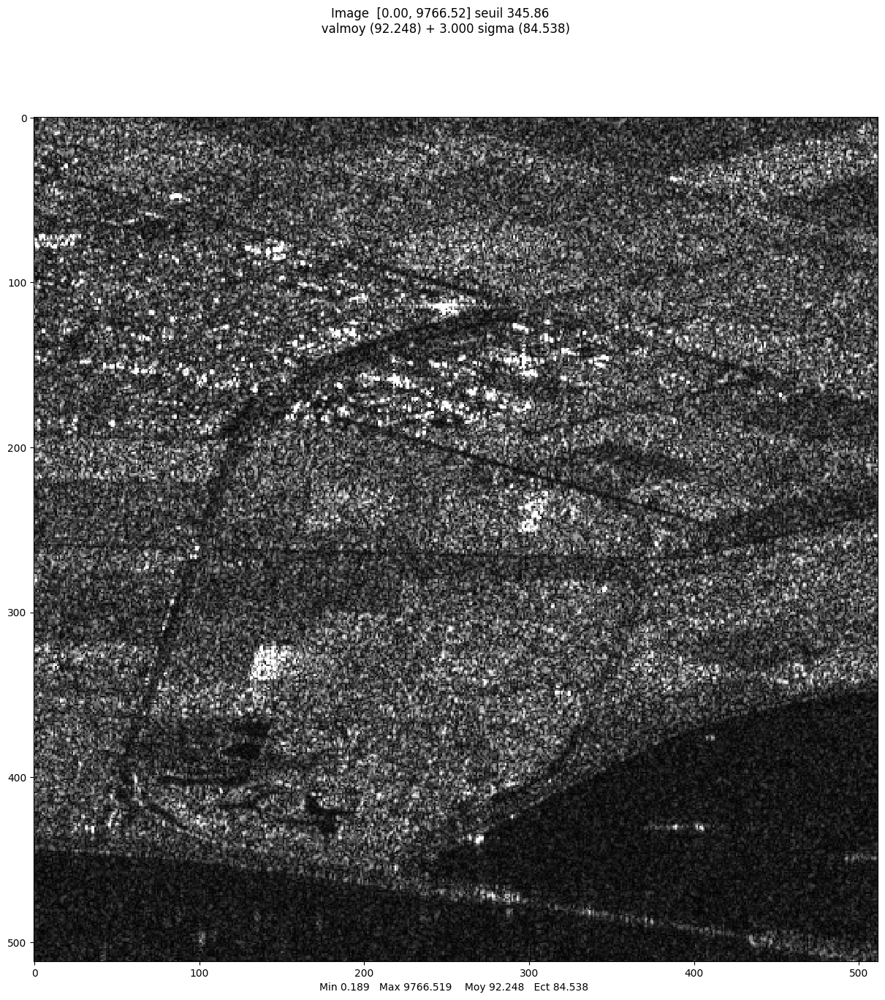

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


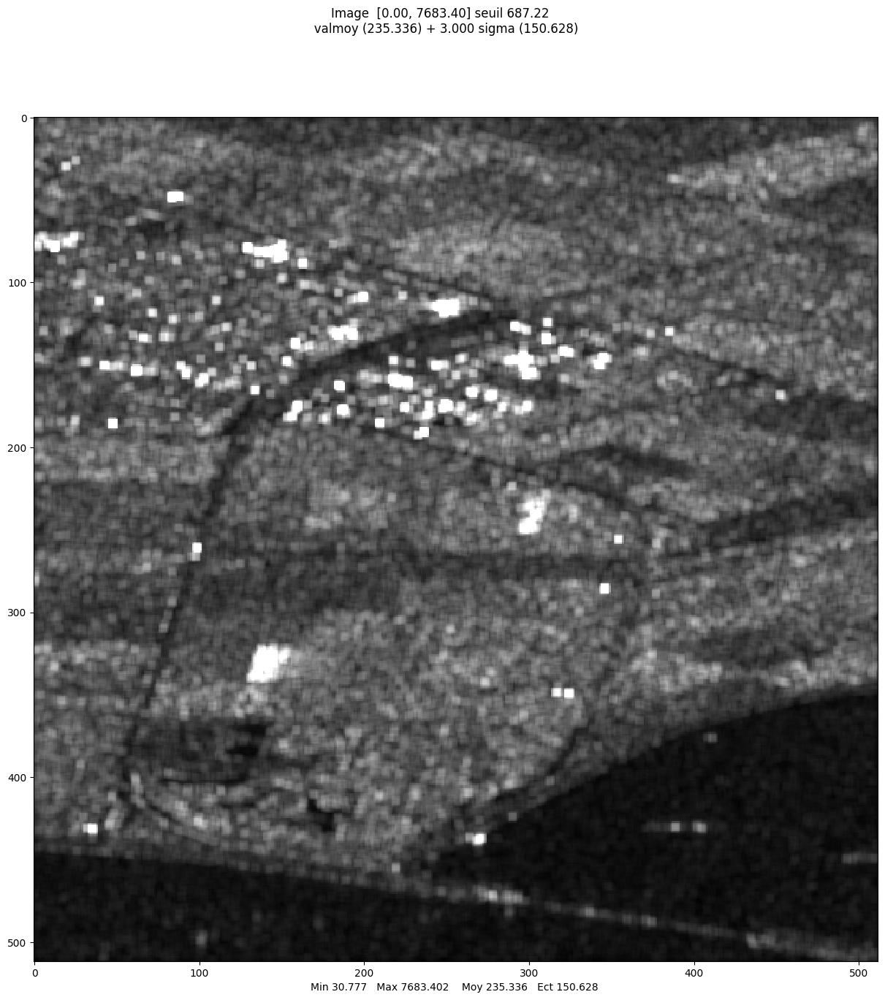

In [ ]:
webpage='https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/'
image='lely_tuple_multitemp.IMA'
im_lely_multitemp = mvalab.imz2mat(webpage+image)
lely_crop_slc = im_lely_multitemp[0][:,:,0]

# take the intensity 
ima_int = np.abs(lely_crop_slc)**2 #complete
mvalab.visusar(np.sqrt(ima_int));

# create the average window
size_window = 5
masque_loc = np.ones((size_window,size_window)) #complete

# compute the mean image (intensity data)
ima_int_mean = scipy.signal.convolve2d(ima_int,masque_loc,mode='same')/size_window #complete

# diplay the result
mvalab.visusar(np.sqrt(ima_int_mean));


### Question C.1
What is the effect of the mean filter ? (advantages and drawbacks). What is the influence of the window size ? 

### Answer C.1

Analyzing the filtered image it is possible to observe that the mean filter smooths out the image, reducing the speckle noise. This is particularly useful in areas where the scene is homogeneous, as the noise tends to be uncorrelated and the averaging process helps to cancel it out (increasing signal-to-noise ratio). Generally, it is advisable to use the mean image as a reference, as it can provide a more accurate representation of the underlying signal than noisy images. 

However, it is important to observe that the mean filter can also smooth out important features of the image, and may not be appropriate in all cases. The choice of window size for the mean filter can also have a significant impact on the resulting image, with larger window sizes tending to smooth out more of the image.

### C. 2 Computation of the local standard deviation and the local coefficient of variation 

Using convolution operations as indicated in the following code compute the local standard deviation (and visualize it) and do the same for the local coefficient of variation. 

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


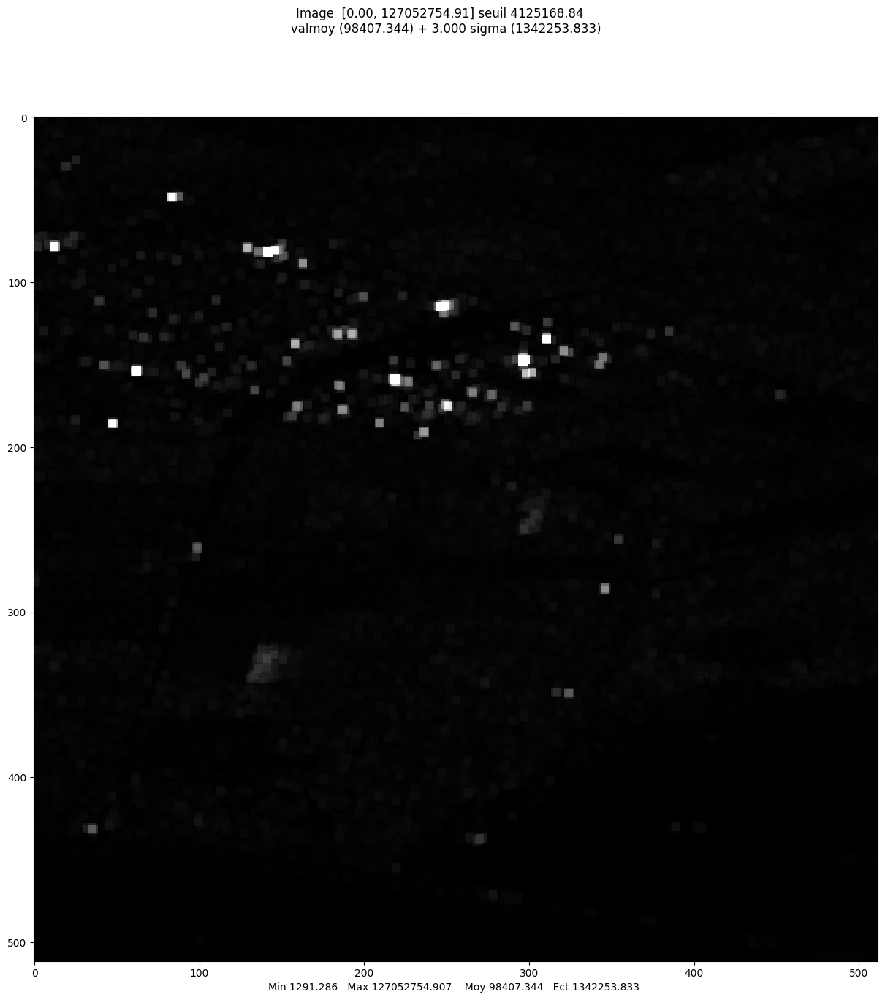

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


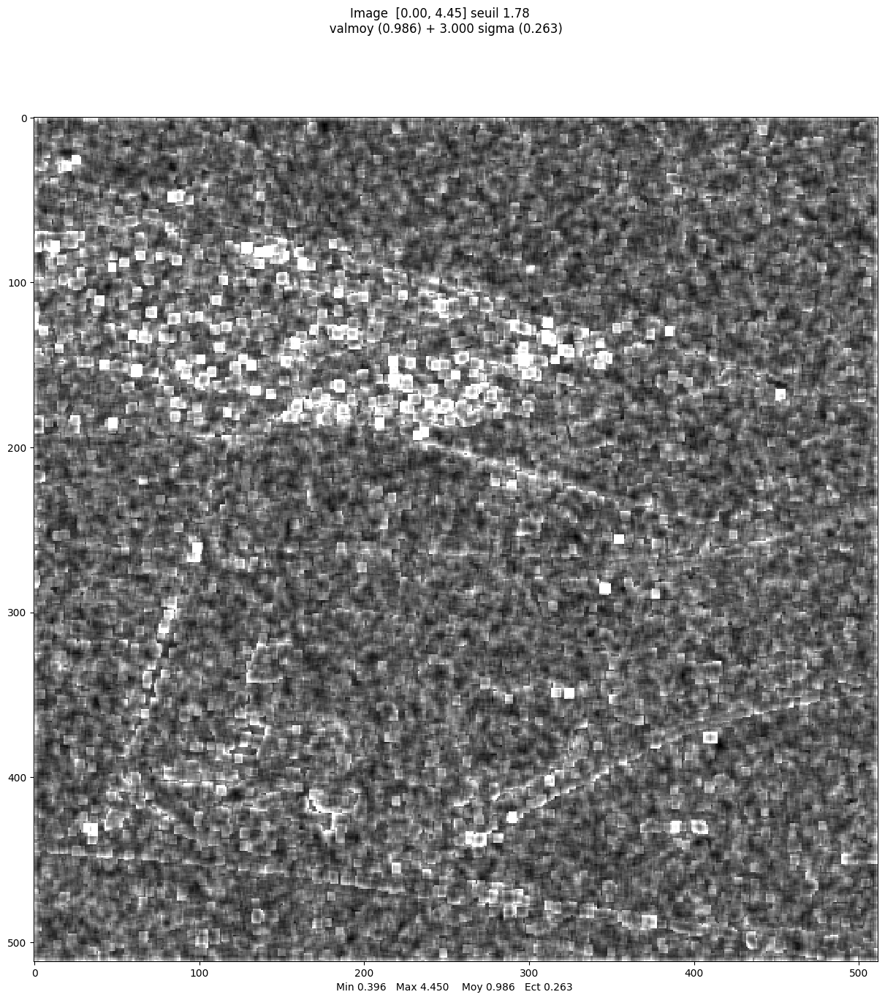

In [ ]:
# compute the variance image (var{I} = E{I^2} - E{I}^2)
ima_int_square = np.abs(lely_crop_slc)**4 # I^2 
ima_int_mean_square = signal.convolve2d(ima_int_square,masque_loc,mode='same') #complete E{I^2}
ima_variance = ima_int_mean_square - ima_int_mean**2  #complete to compute the variance
# complete to compute the variance  

# compute coefficient of variation
ima_coeff_var = np.sqrt(ima_variance)/ima_int_mean #complete

# visualize these two images to compare them 
mvalab.visusar(np.sqrt(ima_variance));
mvalab.visusar(ima_coeff_var);


### Question C.2
Which information is enhanced in the image of the local standard deviation ? In the image of the local coefficient of variation ? Which one is the more useful ? 



### Answer C.2

Considering two different homogeneous regions, we may observe different variations in pixel intensities. This is apparent in the first image, where the fields and roads are homogeneous, but the roads have a lower intensity than the fields.

By calculating the coefficient of variation, we can divide the standard deviation by the mean value of the regions, allowing us to have a better understanding of the relative variability of the regions. In the second image, we can observe that the corners of the roads have a higher coefficient of variation than the fields. Overall, using the coefficient of variation provides a more accurate representation of the image's variability in comparison to solely relying on pixel intensities.

### C.3 Image despeckling with Lee filter

The local coefficient of variation is also used in a very famous filter for SAR images: the Lee filter. 
The principle of the filter is to combine the pixel value $I_s$ (intensity value of pixel $s$) and the local mean $\hat{\mu}_{s}$ depending on the local coefficient of variation $\hat{\gamma}_s$ with the following formula :
$$
  \hat{I}_s= \hat{\mu}_{s}+k_s (I_s-\hat{\mu}_{s})
$$

and
$$
  k_s=1- \frac{\gamma_{Sp}^2}{\hat{\gamma}_s^2}
$$

$\gamma_{Sp}$ is the theoretical value of the coefficient of variation for a pure speckle ($\gamma_{Sp}=\frac{1}{\sqrt{L}}$ for a L-look intensity image). For an SLC image, $L=1$.

Using the previous results, compute the image filtered by the Lee filter. 
Warning $k$ should be between 0 and 1. 


Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


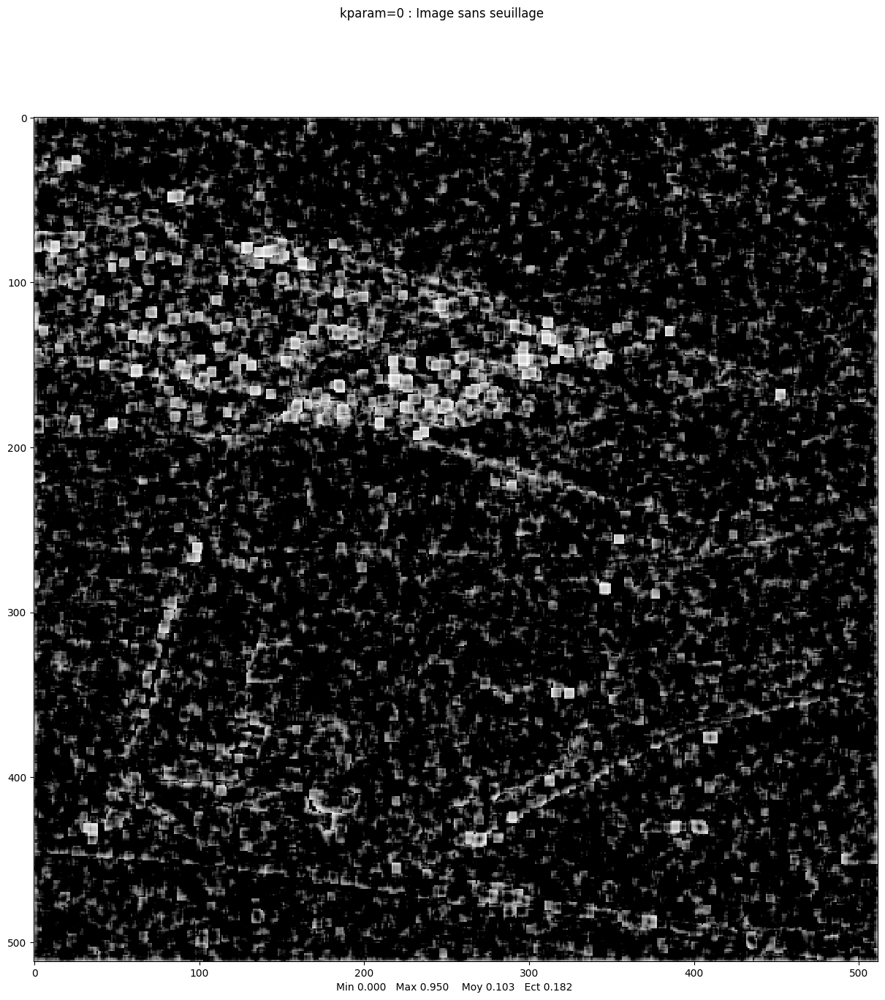

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


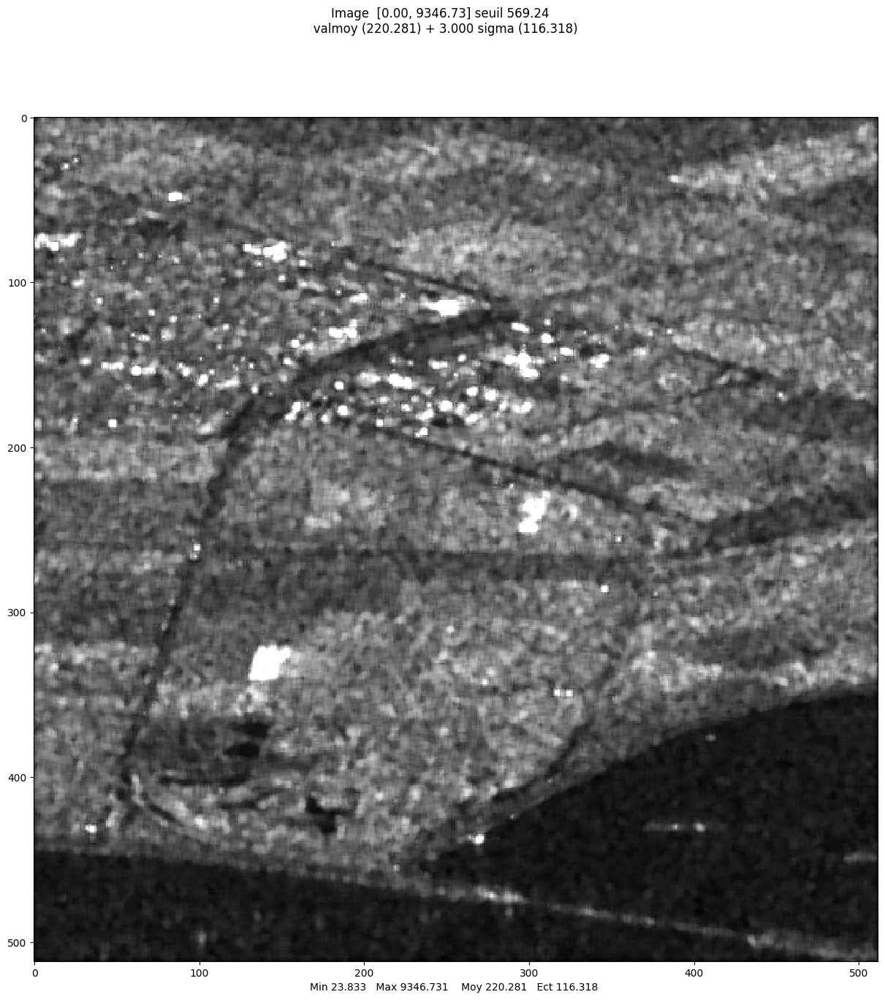

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


<Figure size 1500x1500 with 0 Axes>

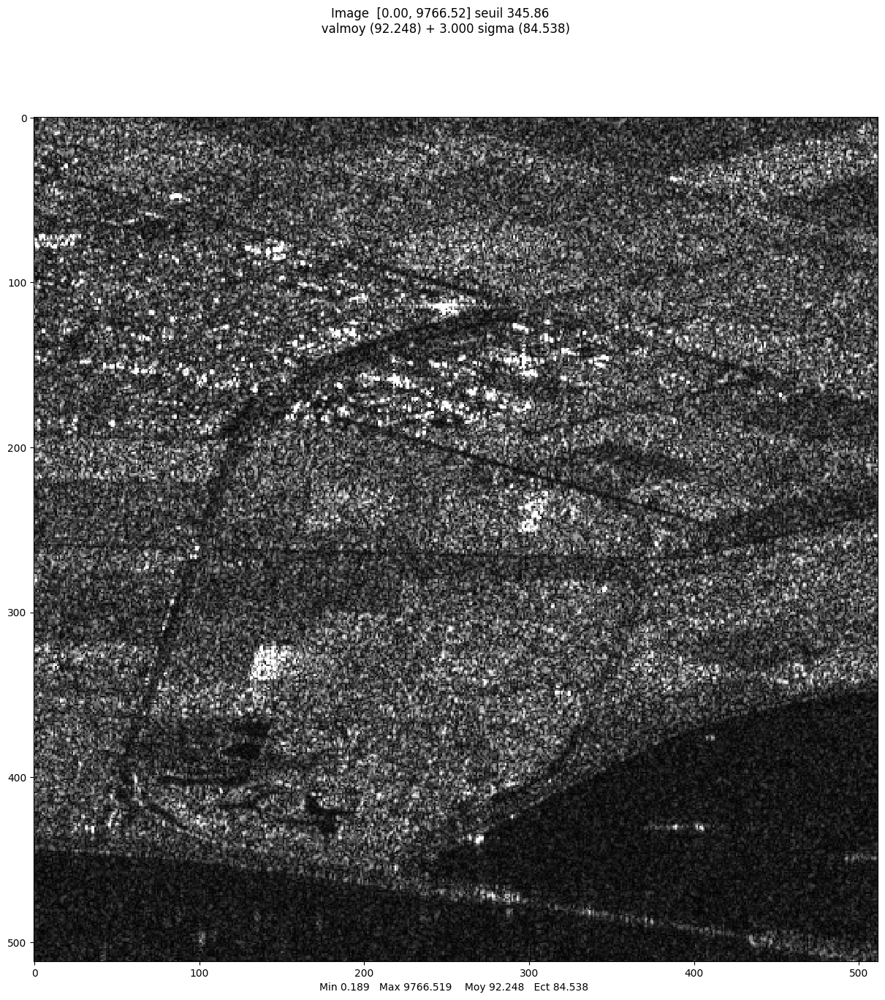

Text(0.5, 0.98, 'Original image')

<Figure size 1500x1500 with 0 Axes>

In [ ]:
# compute ks, by taking ima_coeff_var previously computed
ks = 1 - 1/ima_coeff_var**2 #complete

# force k to have values comprised in the range [0,1]
ks= np.clip(ks,0,1)
mvalab.visusar(ks,0)

# filter the image
image_lee_filtered = ima_int_mean + ks*(ima_int - ima_int_mean) #complete 

mvalab.visusar(np.sqrt(image_lee_filtered))
plt.suptitle(u'Image denoised using Lee filter')
mvalab.visusar(np.sqrt(ima_int))
plt.suptitle(u'Original image')

### Question C.3

Compare the results of the mean filter and the Lee filter. Study the influence of the size of the window of the filters. 


### Answer C.3: 

The Lee filter is a statistical filter that takes advantage of the homogeneity of the image to reduce noise, preserving edges and fine structures in the image and avoiding to introduce artifacts. 

Increasing the mask size in the Lee's filter affects mainly the homogeneous zones, whereas the mean filter blurs the entire image uniformly. On the other hand, the Lee's filter is less effective at removing noise in non-homogeneous regions of the image and if the mask size is too large, the information from the inhomogeneous zones will start to blend into the homogeneous zones. In the case of the mean filter, if the mask size is too large, the image will be blurred and the edges and fine details will be lost.

Therefore, it is important to carefully select the mask size for both filters to achieve the desired level of smoothing while preserving the relevant information in the image.

## Filtering of image "Lely" and comparison with a deep learning algorithm
In this part, we will repeat the process done above to denoise a crop of image "Lely" using the Lee filter. Then, we will compare it with the result of a deep learning algorithm called SAR2SAR (https://arxiv.org/abs/2006.15037).

### C.4 Denoised image: SAR2SAR
The Lee filter presents some limits. More recent approaches to suppress noise rely on sofisticated algorithms. You can plot the image of Lely denoised using a deep learning algorthm called SAR2SAR and compare visually the result with the image filtered using the Lee filter.
  

imz2mat : version janvier 2018.  Fichier à ouvrir : https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA
Nom compatible url
Nom compatible url
INFO - reading header/dim : https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.dim
Multitemporal image 25 data
Fichiers PC
Image  complex float
lecture .dim OK -> largeur:512 hauteur:512 profondeur:25
Debug 2 4 512
4 512 <f
Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


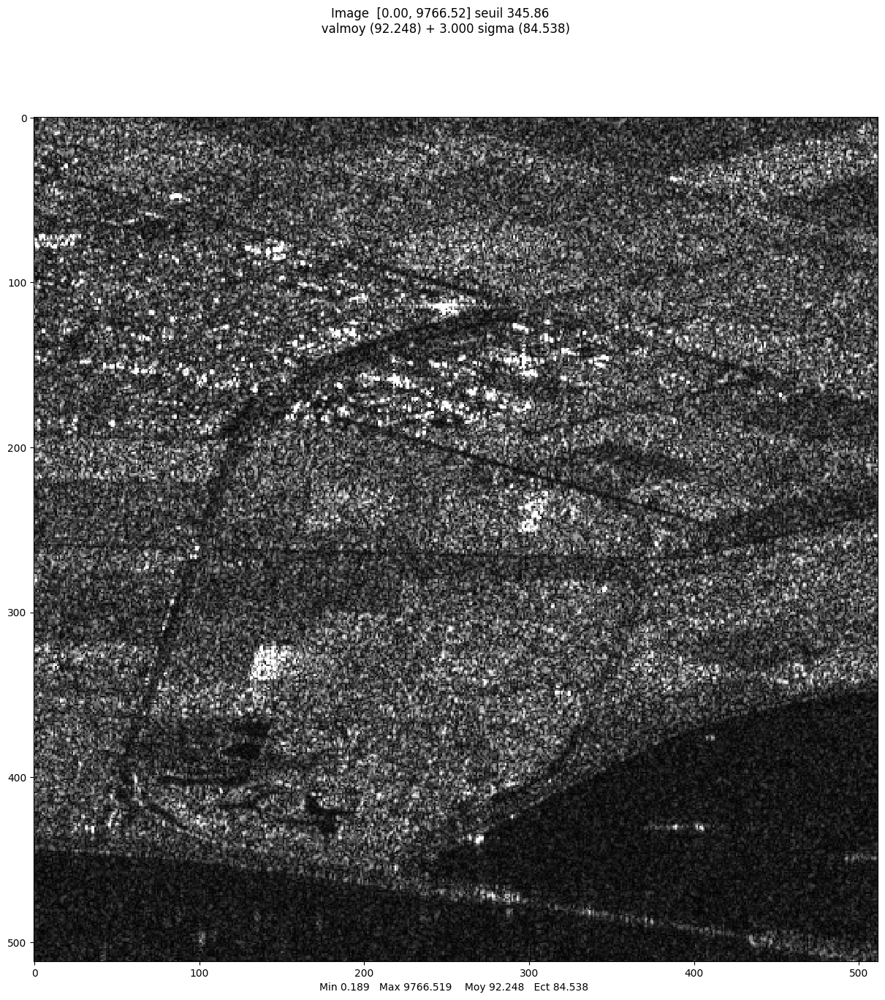

array([[ 81.21993782,  58.69940716,  80.3397685 , ...,  26.10414234,
         37.10719022,  45.52304538],
       [ 44.12464853,  36.57726653,  23.19817862, ..., 140.98266879,
         98.10883557,  33.43982873],
       [ 53.41426149,  82.64074302,  51.89143336, ..., 122.14098789,
        129.29210863,  83.94571176],
       ...,
       [ 30.85666249,  33.06484365,  10.81522518, ...,  82.67995117,
         27.30657278,  63.19518511],
       [ 17.79091311,  33.24368228,  37.86263303, ...,  99.07764159,
         56.9747946 ,  85.5316844 ],
       [ 26.24653218,  50.92780448,  18.30324226, ...,  88.86028395,
         29.03594346, 117.02692705]])

In [ ]:
# apply the Lee filter on the following image :
# !wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA
# !wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.dim
image = 'https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA' 
part_lely_slc = mvalab.imz2mat(image)
part_lely_int = np.square(np.abs(part_lely_slc[0][:,:,0]))
mvalab.visusar(np.sqrt(part_lely_int))

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


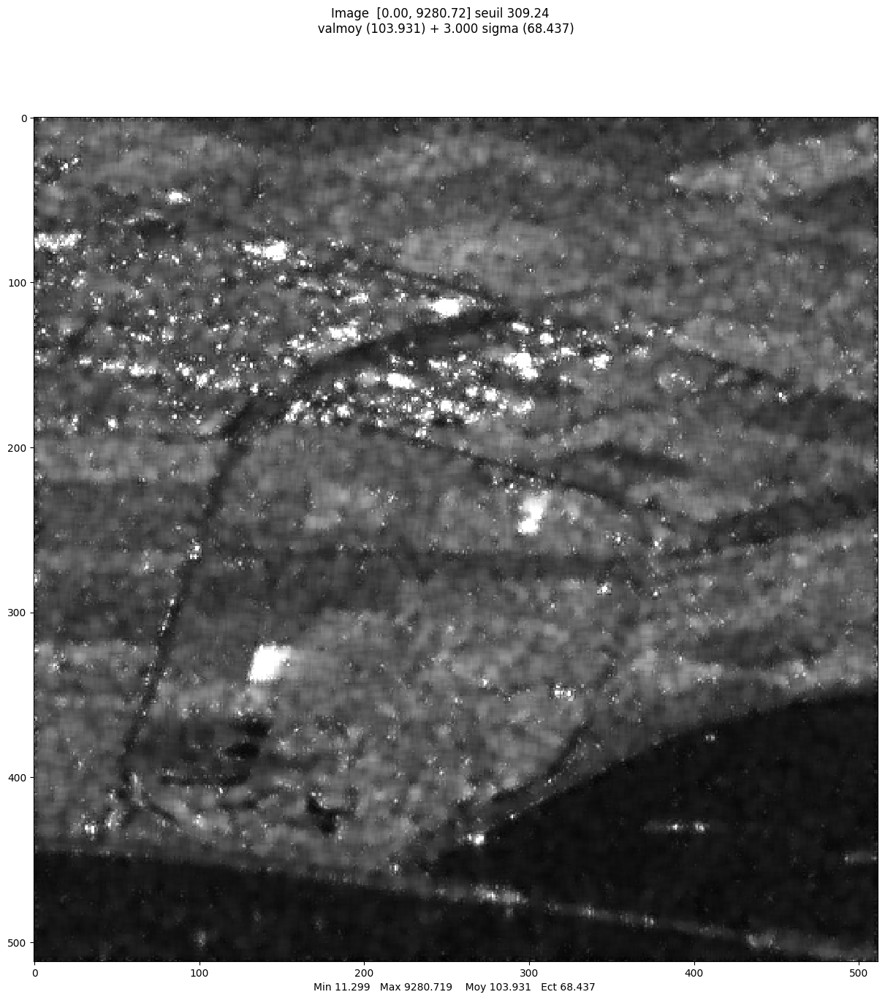

Text(0.5, 0.98, 'Image denoised using Lee filter')

<Figure size 1500x1500 with 0 Axes>

In [ ]:
# using your previous code, filter the image part_lely_int with the Lee filter 

# create the average window
size_window = 7
masque_loc = np.ones((size_window,size_window)) / size_window**2 #complete

# compute the mean image (intensity data)
part_lely_int_mean = signal.convolve2d(part_lely_int,masque_loc,mode='same') #complete

# compute the variance image (var{I} = E{I^2} - E{I}^2)
part_lely_int_square = part_lely_int**2 # I^2 
part_lely_int_mean_square = signal.convolve2d(part_lely_int_square,masque_loc,mode='same') #complete E{I^2}
ima_variance = part_lely_int_mean_square - part_lely_int_mean**2  #complete to compute the variance
# complete to compute the variance  

# compute coefficient of variation
ima_coeff_var = np.sqrt(ima_variance)/part_lely_int_mean #complete

# visualize these two images to compare them 
# mvalab.visusar(np.sqrt(ima_variance));
# mvalab.visusar(ima_coeff_var);

# compute ks, by taking ima_coeff_var previously computed
ks = 1 - 1/ima_coeff_var**2 #complete

# force k to have values comprised in the range [0,1]
ks= np.clip(ks,0,1)
# mvalab.visusar(ks,0)

# filter the image
image_lee_filtered = part_lely_int_mean + ks*(part_lely_int - part_lely_int_mean) #complete 

mvalab.visusar(np.sqrt(image_lee_filtered))
plt.suptitle(u'Image denoised using Lee filter')


In [ ]:
# this image has already been processed by a CNN based filter
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.IMA
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.dim



--2023-05-09 19:14:34--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.IMA
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 26214400 (25M)
Saving to: ‘lely_tuple_multitemp_SAR2SAR.IMA’

lely_tuple_multitem 100%[===================>]  25.00M  12.6MB/s    in 2.0s    

2023-05-09 19:14:37 (12.6 MB/s) - ‘lely_tuple_multitemp_SAR2SAR.IMA’ saved [26214400/26214400]

--2023-05-09 19:14:37--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.dim
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sen

imz2mat : version janvier 2018.  Fichier à ouvrir : lely_tuple_multitemp_SAR2SAR.IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
Dans ximaread : lecture du canal 0/25
image en .IMA
image en .IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
image en .ima  512   512   canaux: 25  verif :  1
512 512
-type FLOAT
lecture de  lely_tuple_multitemp_SAR2SAR.IMA  en quelconque 512 512 25  offset  0 <f 4  complex 0 blocksize 1048576
Boucle de lecture entre 0 et 25   sur 25 canaux
Lecture du canal 1/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 2/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 3/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 4/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 5/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 6/25
Données réelles. Nouvell

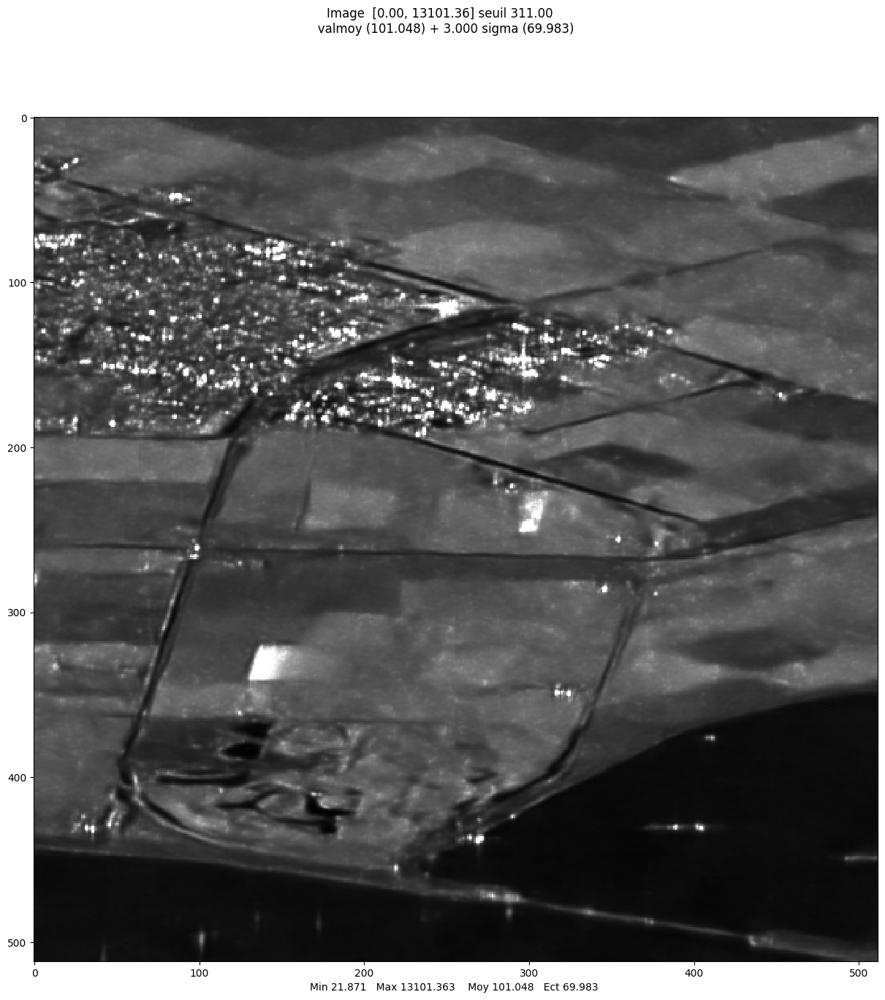

array([[108.26735687, 108.92593384, 117.21216583, ...,  87.13925171,
         89.79171753,  89.75721741],
       [105.54544067, 111.25749207, 116.15348053, ...,  95.23865509,
         96.19988251,  95.58480072],
       [105.72384644, 114.29315186, 116.50016022, ..., 100.59217072,
        100.78230286, 100.22771454],
       ...,
       [ 40.31035233,  38.88003159,  38.09856415, ...,  82.76222992,
         81.49038696,  81.83437347],
       [ 39.99552917,  38.5390358 ,  38.96235657, ...,  84.42482758,
         84.06273651,  83.64545441],
       [ 40.69298935,  38.59126282,  38.61891174, ...,  81.21070862,
         82.10493469,  87.46295166]])

In [17]:
im_lely_multitemp_denoised = mvalab.imz2mat('lely_tuple_multitemp_SAR2SAR.IMA')
im1_d = np.abs(im_lely_multitemp_denoised[0][:,:,0]) #amplitude
mvalab.visusar(im1_d)

### Question C.4
Do a comparison between the CNN filtering and the Lee filter. Comment the two results. Are homogeneous areas well restored? Do the methods preserve edges and fine structures? Are artifacts introduced?

### Answer C.4

Analyzing the images it is possible to observe that the image filtered by the CNN presents a better result (qualitatively), reducing the noise and preserving the edges and fine structures. The region with buildings is better represented and it is possible to discern several constructs that were indistinguishable in the image filtered by the Lee filter. However, some regions have a blurred appearance such as: the fields and some roads (the image in general has this blurred aspect). There is not any noticeable artifact inserted in the image.

Since the Lee filter is not effective at removing noise in non-homogeneous regions, the region with buildings presents a lot of noise. On the other hand, the resulting image has less blur than the CNN filtered image.

Overall, CNN filtering is a more advanced technique, it can be trained to remove a wide range of noise types and can be more effective than the Lee filter at removing noise in non-homogeneous regions. However, CNN filtering can introduce artifacts in the image and can sometimes blur fine details and edges.

## D. Method noise
Performances of a denoising algorithm can be visually interpreted by looking at the *residual noise* (i.e. the ratio between the noisy image and the denoised image, in intensity). For a quantitative evaluation, we can look at the noise statistics, knowing that, in intensity, statistics of speckle S are:
- $\mu_S=1$
- $\sigma^2_S = \frac{1}{L}$

### Question D
Compute the aforementioned ratio image, mean value and variance for the image restored using the Lee filter and the result of SAR2SAR. Comment the results.

What is the interest of computing the method noise ? What are your conclusions for the two previous filters ?

### Answer D

After analyzing the ratio images, particularly the region with the buildings, it becomes evident that Lee's filter was ineffective in suppressing the noise in this non-homogeneous area. Conversely, the SAR2SAR filter produced a ratio image that is homogeneous and has a low intensity, indicating that it efficiently suppressed noise while preserving the characteristics of this non-homogeneous area.

Furthermore, the ratio images also demonstrate that the CNN method tends to blur edges and fine details. In the ratio image of the SAR2SAR method, the noise on the roads merges with the noise in the surrounding areas, whereas, in the ratio image of Lee's filter, the roads are distinguishable.

The method noise is significant in quantifying the quality of the filter, as it provides a quantitative measure of the amount of noise left in the image after filtering. It can also be used to optimize the filter parameters to obtain the best results possible.

Although SAR2SAR filter produced better qualitative results, the mean and standard deviation indicate that Lee's filter performed better in reducing noise. One possible explanation for this slight difference could be the artifacts introduced by the CNN.





Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


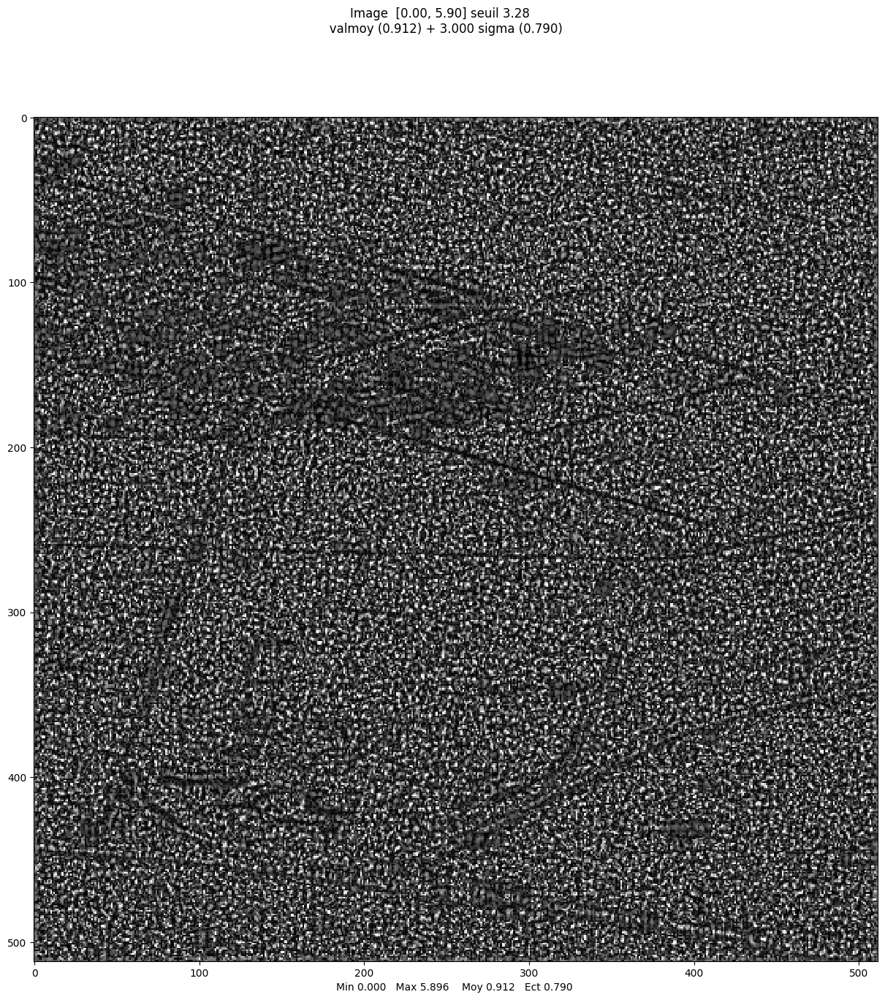

LEE FILTER: mean = 0.9124167702926953 and var = 0.6236372730315285
Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


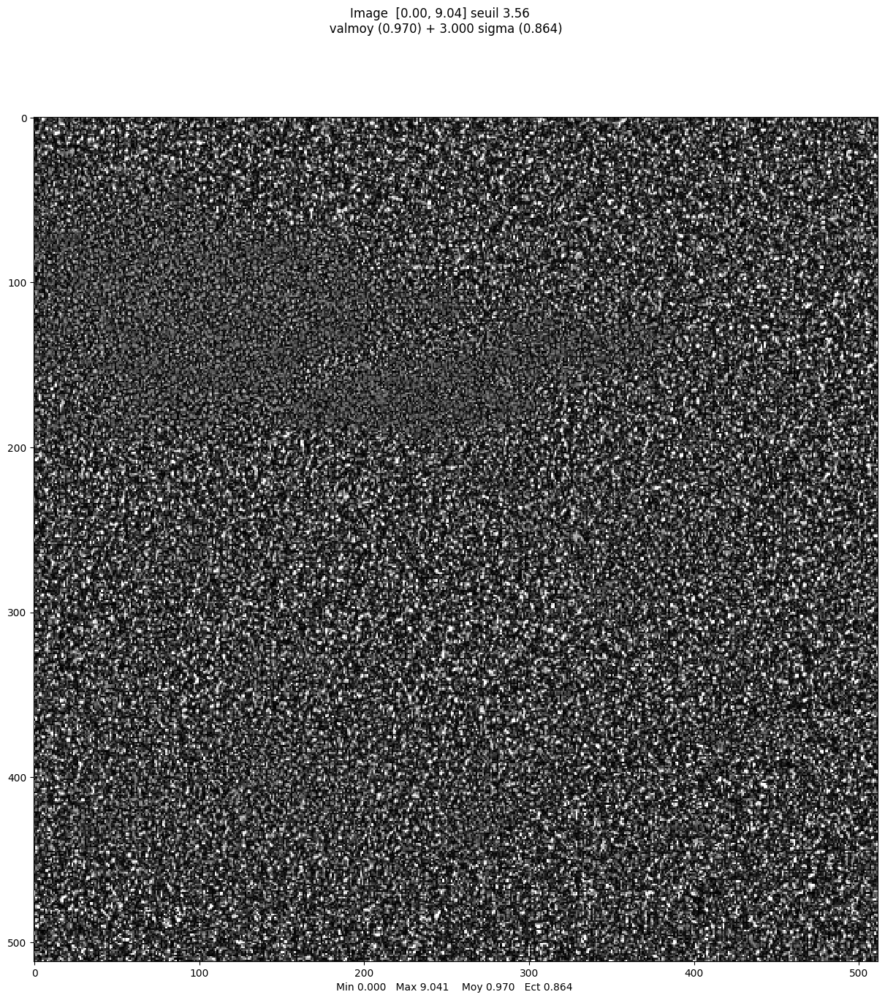

SAR2SAR: mean = 0.9697834638584217 and var = 0.7457658171745046


In [24]:
# Plot the residual noise
res_noise_lee = part_lely_int/image_lee_filtered  #complete
mvalab.visusar(res_noise_lee)
mean_lee = np.mean(res_noise_lee)
var_lee = np.var(res_noise_lee)
print('LEE FILTER: mean = '+str(mean_lee)+' and var = '+str(var_lee))

res_noise_deep = part_lely_int/im1_d**2  #complete
mvalab.visusar(res_noise_deep)
mean_deep = np.mean(res_noise_deep)
var_deep = np.var(res_noise_deep)
print('SAR2SAR: mean = '+str(mean_deep)+' and var = '+str(var_deep))

In [29]:
from skimage import io

import platform
import tempfile
import os
from scipy import ndimage as ndi
try:
    import maxflow
except:
    !pip install PyMaxflow #For Google Colab
    import maxflow
    
from bokeh.plotting import figure, output_file, show
from bokeh.plotting import show as showbokeh
from bokeh.io import output_notebook
output_notebook()

def affiche_pour_colab(im,MINI=None, MAXI=None,titre=''): #special colab, don't look
  def normalise_image_pour_bokeh(X,MINI,MAXI):
    if MAXI==None:
      MAXI = np.max(X)
    if MINI==None:
      MINI = np.min(X)
    imt=np.copy(X.copy())
    imt=(np.clip(imt,MINI,MAXI)/(MAXI-MINI))
    imt[imt<0]=0
    imt[imt>1]=1
    imt*=255
    sortie=np.empty((*imt.shape,4),dtype=np.uint8)
    for k in range(3):
      sortie[:,:,k]=imt
    sortie[:,:,3]=255
    return sortie

  img = im
  img=normalise_image_pour_bokeh(np.flipud(im),MINI,MAXI)
  p = figure(tooltips=[("x", "$x"), ("y", "$y"), ("value", "@image")], y_range=[im.shape[0], 0], x_range=[0, im.shape[1]], title=titre)
  # p.x_range.range_padding = p.y_range.range_padding = 0
  # must give a vector of images
  p.image(image=[np.flipud(im)], x=0, y=im.shape[0], dw=im.shape[1], dh=im.shape[0], palette="Greys9", level="image")
  p.xgrid.visible = False
  p.ygrid.visible = False
  showbokeh(p)

def affiche(im,MINI=0.0, MAXI=None,titre='',printname=False):
  affiche_pour_colab(im,MINI=MINI, MAXI=MAXI,titre=titre) # under google colab many options disappear

affiche(res_noise_lee,MINI=0.0, MAXI=255.,titre="Noisy image",printname=True)
affiche(res_noise_deep,MINI=0.0, MAXI=255.,titre="Noisy image",printname=True)


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 798.4/798.4 kB 16.3 MB/s eta 0:00:00
